In [ ]:
# This project was built on Google Colab as it needs GPU

In [41]:
!nvidia-smi

Thu Sep  5 05:21:56 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   78C    P0              33W /  70W |   1159MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163 (from 1)
Receiving objects: 100% (12163/12163), 156.98 MiB | 23.27 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
import cv2
import pandas as pd
import ntpath
import random
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import imgaug.augmenters as iaa

In [5]:
datadir = 'track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']

data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)
pd.set_option('display.max_colwidth', 1)

In [6]:
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [7]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail

data['center']=data['center'].apply(path_leaf)
data['left']=data['left'].apply(path_leaf)
data['right']=data['right'].apply(path_leaf)

data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


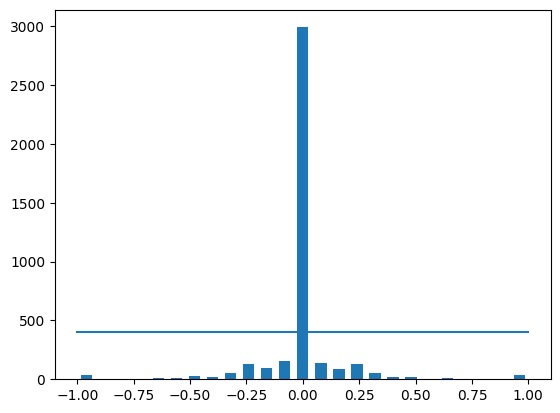

In [8]:
# Visualize data
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+bins[1:])*0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [9]:
data.shape

(4053, 7)

In [10]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i]>=bins[j] and data['steering'][i]<=bins[j+1]:
      list_.append(i)

  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 2590
remaining: 1463


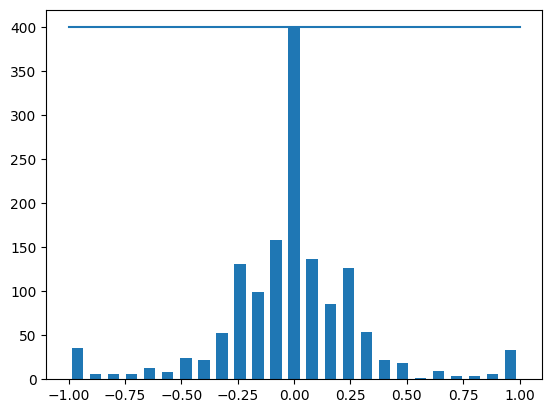

In [11]:
# Visualize data again
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+bins[1:])*0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [12]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []

  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]

    #center image append
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))

    # left image append
    image_path.append(os.path.join(datadir, left.strip()))
    steering.append(float(indexed_data[3]+0.15))

    # right image append
    image_path.append(os.path.join(datadir, left.strip()))
    steering.append(float(indexed_data[3]-0.15))

  image_path = np.asarray(image_path)
  steering = np.asarray(steering)

  return image_path, steering

In [13]:
image_paths, steerings = load_img_steering(datadir+"/IMG", data)

<ipython-input-12-74cde80804fd>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
<ipython-input-12-74cde80804fd>:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
<ipython-input-12-74cde80804fd>:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]+0.15))
<ipython-input-12-74cde80804fd>:19

In [14]:
len(image_paths)

4389

In [15]:
len(steerings)

4389

In [16]:
image_paths

array(['track/IMG/center_2018_07_16_17_11_44_342.jpg',
       'track/IMG/left_2018_07_16_17_11_44_342.jpg',
       'track/IMG/left_2018_07_16_17_11_44_342.jpg', ...,
       'track/IMG/center_2018_07_16_17_16_32_161.jpg',
       'track/IMG/left_2018_07_16_17_16_32_161.jpg',
       'track/IMG/left_2018_07_16_17_16_32_161.jpg'], dtype='<U44')

In [17]:
steerings

array([ 0.  ,  0.15, -0.15, ...,  0.  ,  0.15, -0.15])

In [18]:
# Train test split
x_train, x_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

In [19]:
print('Training Samples: {}\nValid Samples: {}'.format(len(x_train), len(x_valid)))

Training Samples: 3511
Valid Samples: 878


Text(0.5, 1.0, 'Validation Set')

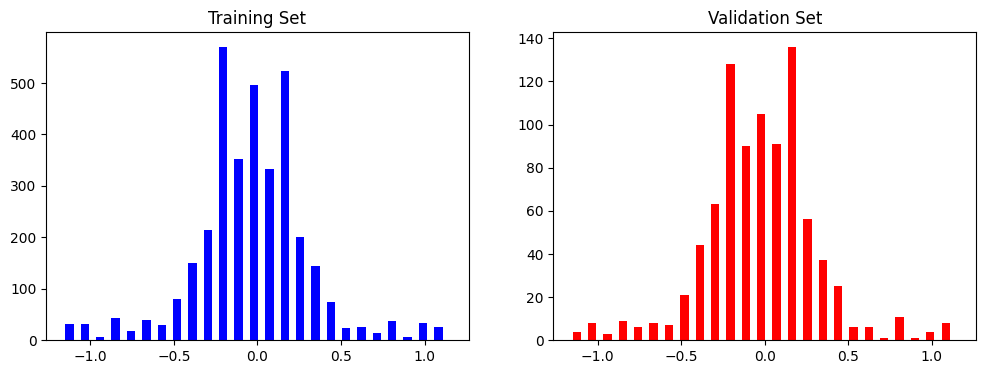

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training Set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation Set')

In [21]:
# Data Augmentation

Text(0.5, 1.0, 'Zoomed Image')

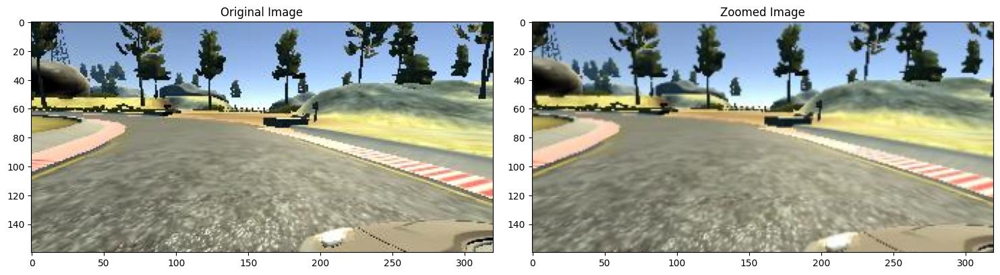

In [22]:
def zoom(image):
  zoom_augmenter = iaa.Affine(scale=(1.0, 1.5))
  image = zoom_augmenter(image=image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(zoomed_image)
axes[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

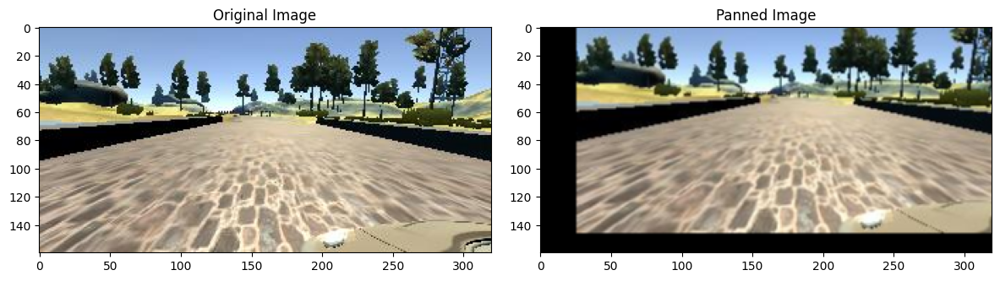

In [23]:
def pan(image):
 pan = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y":(-0.1, 0.1)})
 image = pan.augment_image(image)
 return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')

axes[1].imshow(panned_image)
axes[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness Altered image')

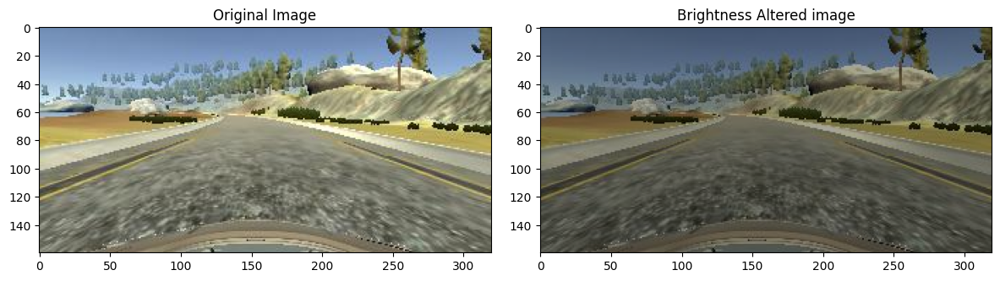

In [24]:
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2, 1.2))
  image = brightness.augment_image(image)
  return image


image = image_paths[random.randint(0, 1000)]
original_image =  mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)


fig, axes = plt.subplots(1,2, figsize=(12, 8))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(brightness_altered_image)
axes[1].set_title('Brightness Altered image')

Text(0.5, 1.0, 'Flipped Image - Steering Angle: 0.2139899')

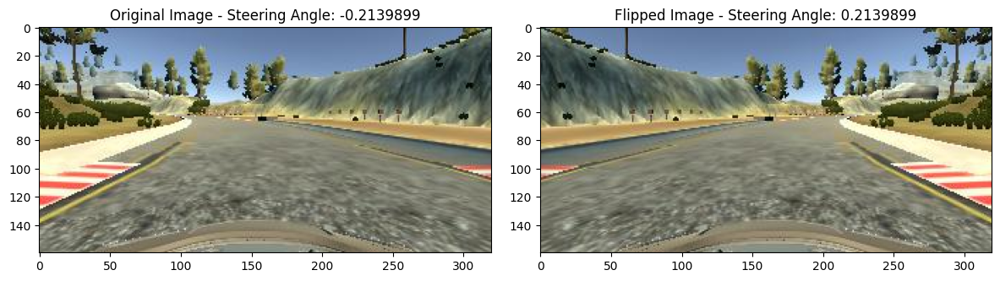

In [25]:
def img_random_flip(image, steering_angle):
  image = cv2.flip(image, 1)
  steering_angle = -steering_angle
  return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axes = plt.subplots(1,2, figsize=(12, 8))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image - ' + 'Steering Angle: '+str(steering_angle))

axes[1].imshow(flipped_image)
axes[1].set_title('Flipped Image - '+'Steering Angle: '+str(flipped_steering_angle))

In [26]:
# combine all augmentation techniques into one function

In [27]:
def random_augment(image, steering_angle):
  image = mpimg.imread(image)
  if np.random.rand()<0.5:
    image = pan(image)
  if np.random.rand()<0.5:
    image = zoom(image)
  if np.random.rand()<0.5:
    image = img_random_brightness(image)
  if np.random.rand()<0.5:
    image, steering_angle = img_random_flip(image, steering_angle)

  return image, steering_angle

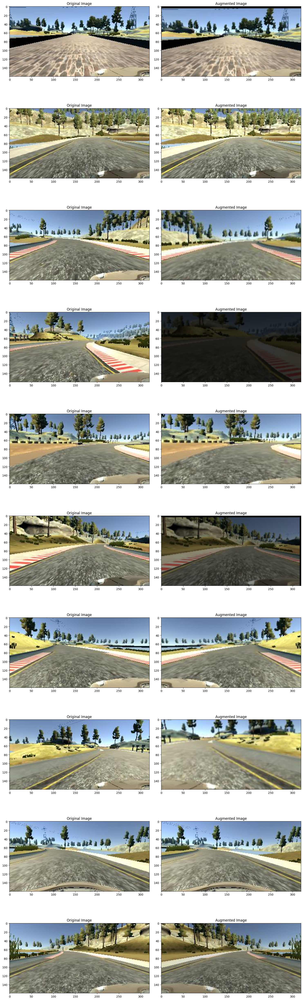

In [28]:
ncol=2
nrow=10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) -1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title('Original Image')

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title('Augmented Image')

Text(0.5, 1.0, 'Preprocessed Image')

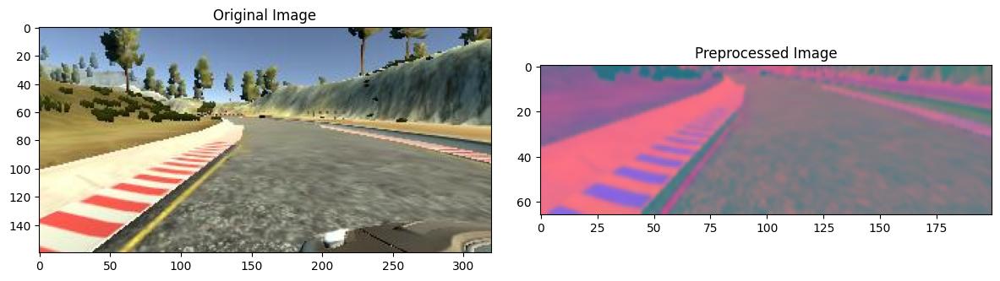

In [29]:
def img_preprocess(img):
  img = img[60:135,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img, (3,3), 0)
  img = cv2.resize(img, (200, 66))
  img = img/255
  return img

image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)


fig, axs = plt.subplots(1, 2, figsize=(12, 8))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [30]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])  # Corrected here
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)

        yield (np.asarray(batch_img), np.asarray(batch_steering))


In [31]:
x_train_gen, y_train_gen = next(batch_generator(x_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(x_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

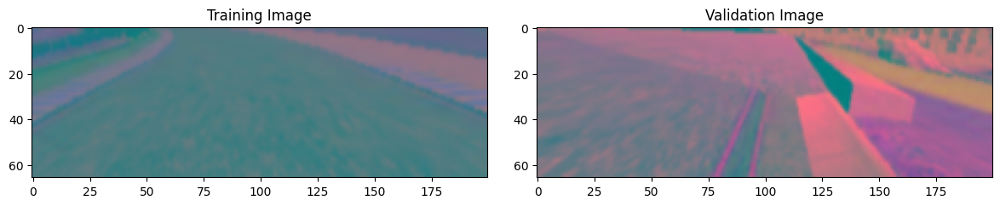

In [32]:
fig, axs = plt.subplots(1,2, figsize=(12, 8))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [33]:
x_train_gen.shape

(1, 66, 200, 3)

In [34]:
x_valid_gen.shape

(1, 66, 200, 3)

In [35]:
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D

In [36]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2,2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5,5), strides=(2,2), activation='elu'))
  model.add(Conv2D(48, (5,5), strides=(2,2), activation='elu'))
  model.add(Conv2D(64, (5,5), activation='elu'))
  model.add(Flatten())
  model.add(Dense(100, activation='elu'))
  model.add(Dense(50, activation='elu'))
  model.add(Dense(10, activation='elu'))
  model.add(Dense(1))


  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)

  return model



In [37]:
model = nvidia_model()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [38]:
display(model.summary)

<bound method Model.summary of <Sequential name=sequential, built=True>>

In [39]:
history = model.fit(batch_generator(x_train, y_train, 100, 1),
                              steps_per_epoch=300,
                              epochs=10,
                              validation_data=batch_generator(x_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle=1
                              )

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 141s 444ms/step - loss: 0.4491 - val_loss: 0.0749
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 125s 419ms/step - loss: 0.0885 - val_loss: 0.0711
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 123s 410ms/step - loss: 0.0834 - val_loss: 0.0651
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 122s 410ms/step - loss: 0.0787 - val_loss: 0.0590
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 125s 417ms/step - loss: 0.0715 - val_loss: 0.0560
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 133s 446ms/step - loss: 0.0655 - val_loss: 0.0497
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 117s 393ms/step - loss: 0.0618 - val_loss: 0.0499
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 117s 392ms/step - loss: 0.0601 - val_loss: 0.0510
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 120s 401ms/step - loss: 0.0598 - val_loss: 0.0476
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 120s 402ms/step - loss: 0.0549 - val_loss: 0.0476


Text(0.5, 0, 'Epoch')

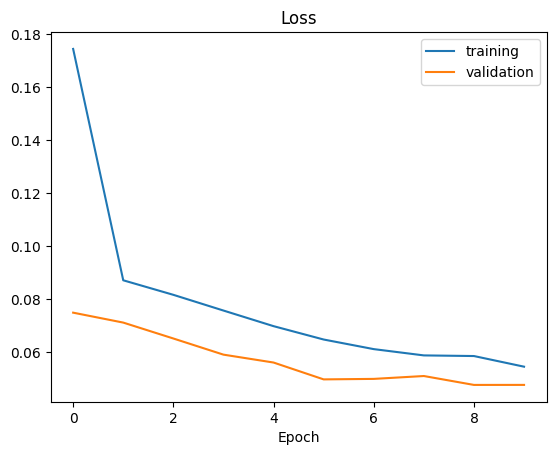

In [40]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')